# **Stable diffusion and flow of latent space using Perlin Noise algorithm.**
***Ernest Warzocha, 2023***

#Work in progress..

An algorithm to explore the Stable Diffusion latent space with Perlin Noise. It's a variation of commonly called *latent space walk*. It applies geometrical transformation of prompt latent space and diffusion noise space.

According to keras docs, Stable Diffusion consists of two latent spaces: 

"*(...) It has two latent spaces: the image representation space learned by the encoder used during training, and the prompt latent space which is learned using a combination of pretraining and training-time fine-tuning.*" [1]

## **Why Perlin noise?**
Perlin noise is a pseudo random gradient noise developed by Ken Perlin in 1983 but still relevant in many applications. It's famous for procedural textures and terrain generation in early era of VFX. Furthermore it can be used to produce natural movement of wind, waves etc. The reason to expermient is to apply smooth yet randomized transition between prompts and latent space by testing various approaches. I decided to check what happens if such procedural noise flows through Stable Diffusion. It's important that Perlin noise generates smooth noise across 1,2 or 3 dimensions.

## **Experiment consists of:**

### **Analysis of proof of concept**
Before starting anything it's crucial to understand the problem and possible outcomes. Analysis tries to gather as much insights as possible.

### **Interpolation**
1.   Interpolation between two prompts with uniform Perlin Noise.

2.   Interpolation between two prompts where 2D vector space interpolates with 2D noise space eventually reaching its target.

### **Perlin noise flow over prompt encoder manifold.**
Behaviour of Stable Diffusion when we let the noise flow through the encoded prompt. There are various approaches presented. Please refer to analysis steps.

### **Perlin noise flow over the diffusion noise space.**
Behaviour of Stable Diffusion when we let the noise flow through the noise space, or when it's mostly made from it.
<!--
## There are several approaches tested:
Please check the attached images of algorithms. We know that Stable Diffusion prompts are encoded to 77 x 768 vector. The animations explain what we are doing. 

We are checking the flow through all values and also masking the unrevelant.

### Free flow:
* **1D Noise, free flow in one direction.**
* **2D Noise, free flow in one direction.**
* **2D Noise, free flow in two directions.**
* **Free flow in place.** The X and Y are stable but Z axis is moving.
* **3D Noise, free flow.** In XYZ directions.

### Unconstrained interpolation:
**Interpolation between two values with noise** which is guaranteed to reach targed value. Noise is multiplied by interpolated and phase-shifted sine which is equal to zero at the beginning and end of process.

### Perlin noise with sine overlay:
Generated **fluid like 2D effect** (or woodcut) by multiplying each number by sine of its noise and a constant number.

### Noise wave:
**Perlin noise waves.** It's different than free flow because it gradually moves the noise value to simulate natural waves or wind. -->

---

### Links:
1. [A walk through latent space with Stable Diffusion](https://keras.io/examples/generative/random_walks_with_stable_diffusion/) (Keras documentation)

2. [Beyond Static Image Generation: Taking Stable Diffusion to the Next Level](https://analytix.nl/post/beyond-static-image-generation-taking-stable-diffusion-to-the-next-level/) 

3. [An image synthesizer](https://dl.acm.org/doi/10.1145/325165.325247), Ken Perlin (ACM SIGGRAPH Computer Graphics, 1985)

4. [Perlin Noise](https://en.wikipedia.org/wiki/Perlin_noise), Wikipedia

5. [High-Resolution Image Synthesis with Latent Diffusion Models](https://arxiv.org/abs/2112.10752), Robin Rombach, Andreas Blattmann, Dominik Lorenz, Patrick Esser, Björn Ommer



# 1. Import libraries.

In [1]:
!pip install tensorflow keras_cv --upgrade --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 634.9/634.9 kB 8.7 MB/s eta 0:00:00


In [2]:
import numpy as np
import keras_cv
import tensorflow as tf
import matplotlib.pyplot as plt

import math
import random
import copy

from PIL import Image
from IPython.display import Image as Img

You do not have Waymo Open Dataset installed, so KerasCV Waymo metrics are not available.


# 2. Stable diffusion setup.
*The JIT compile mode unfortunately freezes Colab.*

In [3]:
IMG_WIDTH = 512
IMG_HEIGHT = 512

tf.keras.mixed_precision.set_global_policy("mixed_float16")

model = keras_cv.models.StableDiffusion(img_width=IMG_WIDTH, img_height=IMG_HEIGHT)

The dtype policy mixed_float16 may run slowly because this machine does not have a GPU. Only Nvidia GPUs with compute capability of at least 7.0 run quickly with mixed_float16.
If you will use compatible GPU(s) not attached to this host, e.g. by running a multi-worker model, you can ignore this warning. This message will only be logged once


By using this model checkpoint, you acknowledge that its usage is subject to the terms of the CreativeML Open RAIL-M license at https://raw.githubusercontent.com/CompVis/stable-diffusion/main/LICENSE


# 3. Encoded text vector analysis
### Basic info
Before we begin, we should check the manipulated vector of prompt latent space. 

* The text is encoded into 78x768 vector. Each row is a time step with 768 encodings.
* Highest and lowest values are some kind of embedding constants same for each prompt.

In [4]:
prompt = "A photograph of a dog"

encoding = model.encode_text(prompt)
encoding = tf.squeeze(encoding)

highest_value = tf.math.reduce_max(encoding)
lowest_value = tf.math.reduce_min(encoding)
average_value = tf.math.reduce_mean(encoding)

print(f"\nEncoding vector dims: {encoding.shape} \t Highest value: {highest_value} \t Lowest value: {lowest_value} \t Average: {average_value}\n")
print(encoding)

492466864/492466864 [==============================] - 6s 0us/step

Encoding vector dims: (77, 768) 	 Highest value: 33.09375 	 Lowest value: -28.078125 	 Average: -0.1085205078125

tf.Tensor(
[[-0.3882   0.02293 -0.0522  ... -0.49    -0.3066   0.06744]
 [ 0.02635 -1.322    0.3171  ... -0.53     0.9756   0.663  ]
 [ 0.4624   0.562    1.654   ... -1.953   -1.231    0.0105 ]
 ...
 [-0.6826  -0.08374  0.3699  ...  0.2693  -0.481    0.1405 ]
 [-0.678   -0.09424  0.3936  ...  0.2788  -0.4634   0.1562 ]
 [-0.6567  -0.0626   0.4233  ...  0.2744  -0.4036   0.1052 ]], shape=(77, 768), dtype=float16)


### Averages on axes.
Averages across time steps are consistent unlike across dimensions.

In [5]:
average_across_time_steps = tf.math.reduce_mean(encoding, axis=1)
average_across_dimensions = tf.math.reduce_mean(encoding, axis=0)

print(f"Average across time steps: {average_across_time_steps.shape}\n")
print(average_across_time_steps)

# print(f"\nAverage across dimensions: {average_across_dimensions.shape}\n")
# print(average_across_dimensions)

Average across time steps: (77,)

tf.Tensor(
[-0.1048  -0.1104  -0.11127 -0.1136  -0.1128  -0.10443 -0.11053 -0.11017
 -0.1099  -0.10956 -0.1093  -0.1091  -0.1087  -0.10846 -0.10834 -0.108
 -0.10785 -0.1076  -0.10736 -0.10724 -0.107   -0.1069  -0.1069  -0.1067
 -0.10693 -0.1072  -0.1074  -0.10767 -0.1077  -0.1081  -0.10815 -0.10815
 -0.10815 -0.10815 -0.10834 -0.10846 -0.10846 -0.10864 -0.1086  -0.10864
 -0.1086  -0.1086  -0.10864 -0.10864 -0.10864 -0.10864 -0.10864 -0.10864
 -0.1087  -0.1087  -0.10864 -0.10864 -0.1087  -0.10864 -0.10864 -0.10864
 -0.1086  -0.10864 -0.1086  -0.10846 -0.10846 -0.10846 -0.10846 -0.10846
 -0.10846 -0.1084  -0.1084  -0.1084  -0.1084  -0.10846 -0.10846 -0.10846
 -0.10846 -0.10846 -0.10846 -0.1084  -0.10846], shape=(77,), dtype=float16)


### Visualize the encoding
An obvious conclusion about attention models reval that more detailed prompts go deeper into time steps. There are two constant values that are extremes of each encoding. I don't know if we should touch them but for the purpose of visualization extreme values are reduced to 0.

We can clearly see the pattern here. We shall try horizontal and vertical Perlin noise flow.

Short prompt encoding:



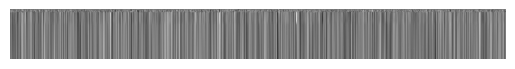

Long prompt encoding:



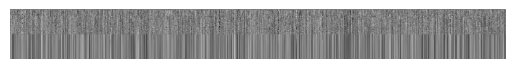

In [6]:
def encoding_visualize(encoding):
    vis_encoding = tf.where(tf.logical_or(encoding > 5, encoding < -5), 0.0, encoding)
    plt.axis("off")
    plt.imshow(vis_encoding, cmap="gray")
    plt.show()
    return vis_encoding


short_prompt = "a picture of pug"
long_prompt = "a pug too lazy to eat his cookies, fantasy art, golden color, high quality, highly detailed, elegant, sharp focus, concept art, character concepts, digital painting, mystery, adventure"

short_prompt_encoding = model.encode_text(short_prompt)
long_prompt_encoding = model.encode_text(long_prompt)

short_prompt_encoding = tf.squeeze(short_prompt_encoding)
long_prompt_encoding = tf.squeeze(long_prompt_encoding)

print("Short prompt encoding:\n")
short_encoding_vis = encoding_visualize(short_prompt_encoding)

print("Long prompt encoding:\n")
long_encoding_vis = encoding_visualize(long_prompt_encoding)

### Mask significant neurons:
This mask is necessary for flows through significant neurons only.


In [7]:
def mask_significant_neurons(encoding, min, max):
    mask = tf.where(tf.logical_or(encoding > max, encoding < min), 1, 0)
    mask = tf.cast(mask, 'float16')
    return mask

### Preview significant neurons

Neuron significance threshold over: +/- 0.5
Significant neurons: 35909


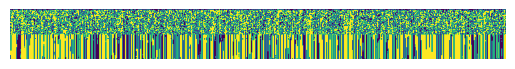

Neuron significance threshold over: +/- 1.0
Significant neurons: 18249


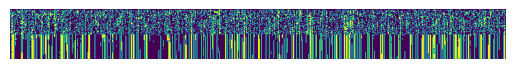

Neuron significance threshold over: +/- 1.5
Significant neurons: 7545


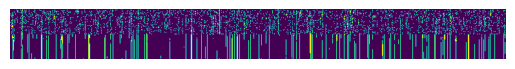

Neuron significance threshold over: +/- 2.0
Significant neurons: 2414


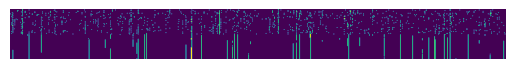

Neuron significance threshold over: +/- 2.5
Significant neurons: 716


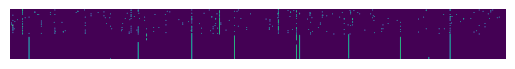

Neuron significance threshold over: +/- 3.0
Significant neurons: 260


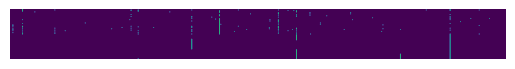

Neuron significance threshold over: +/- 3.5
Significant neurons: 114


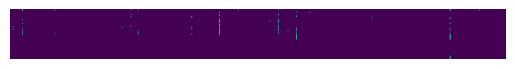

Neuron significance threshold over: +/- 4.0
Significant neurons: 76


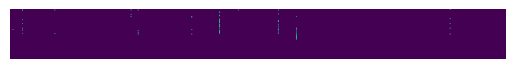

In [8]:
for i in range(1,9):

    lim = i * 0.5

    significant_neurons = mask_significant_neurons(long_prompt_encoding, -lim, lim)
    plt.axis("off")
    plt.imshow(significant_neurons)
    print(f"Neuron significance threshold over: +/- {lim}")
    print(f"Significant neurons: {np.count_nonzero(significant_neurons)}")
    plt.show()

### Attention threshold
According to previous step we can clearly distingush a moment where time steps doesn't change. We can define a threshold after which we shouldn't change that much. 

Why we are doing this? Because the model wouldn't know on what it should focus if we change values that shouldn't be changed.

In [9]:
def get_single_column_threshold(column):
    col_size = len(column)
    col_threshold = 0

    for i in range(col_size):
        start = col_size
        chunk = column[i:col_size]

        min = tf.reduce_min(chunk)
        max = tf.reduce_max(chunk)
        mean = tf.reduce_mean(chunk)
        amp = abs(max - min)

        if amp < 1:
            col_threshold = i
            break

    return col_threshold    


def get_columns_threshold(encoding):
    size = encoding.shape[1]
    thresholds = []

    for i in range(size):
        column_threshold = get_single_column_threshold(encoding[:, i])
        thresholds.append(column_threshold)

    return thresholds


def create_threshold_mask(encoding, thresholds):
    masked = np.ones(encoding.shape)
    size = encoding.shape[1]

    for i in range(size):
        threshold_range = thresholds[i]
        masked[threshold_range:, i] = 0

    return masked

### Preview the threshold

Original (without max and min):


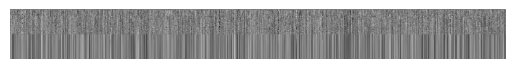

Mask:


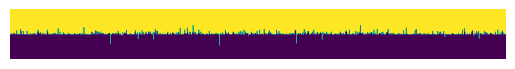

Masking unrelevant time steps:


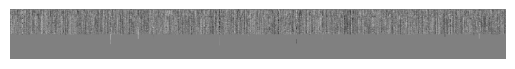

In [10]:
thresholds = get_columns_threshold(long_encoding_vis)

encoding_threshold_mask = create_threshold_mask(long_encoding_vis, thresholds)

masked_encoding = long_encoding_vis * encoding_threshold_mask

plt.axis("off")
plt.imshow(long_encoding_vis, cmap="gray")
print("Original (without max and min):")
plt.show()

plt.axis("off")
plt.imshow(encoding_threshold_mask)
print("Mask:")
plt.show()

plt.axis("off")
plt.imshow(masked_encoding, cmap="gray")
print("Masking unrelevant time steps:")
plt.show()

### Artificial attention tails
If we decide to flow only through space where something is actually encoded we have to somehow update the remaining time steps. There are four options:
- Leave them as they are and not allow noise flow through them.
- Leave them as they are and allow noise flow through them.
- If you print the amplitude in `get_single_column_threshold` function and remove the `break` from loop, you can see that values gradually decreases after the threshold. You can compute the differentiations.
- Update tail by adding the last noise value before the threshold. **Easiest and computationally efficient.**

Below is a way to reconstruct the masked attentions:

Original (without max and min):


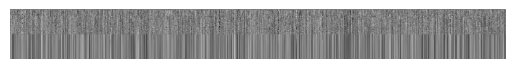

Masked tail:


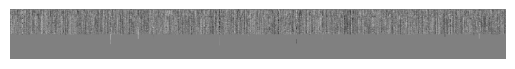

Reconstructed:


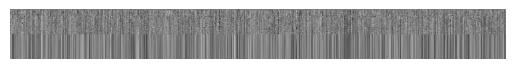

In [11]:
def get_attention_diffs(encoding):

    diffs = encoding.numpy()

    for col_index in range(768):
        diff = np.diff(encoding[:, col_index])
        diff = np.append(diff, 0)
        diffs[:, col_index] = diff

    return diffs


tail_diffs = get_attention_diffs(long_prompt_encoding)


def reconstruct_attention_tails(encoding, diffs, thresholds):

    rec = encoding.numpy()

    for col_index in range(rec.shape[1]):
        threshold = thresholds[col_index]

        current_val = rec[threshold-1, col_index]
        
        for val_index in range(threshold, rec.shape[0]):
            diff = diffs[val_index-1, col_index]
            val = current_val + diff
            current_val = val 

            rec[val_index, col_index] = val

    return rec

reconstructed = reconstruct_attention_tails(masked_encoding, tail_diffs, thresholds)

print("Original (without max and min):")
plt.axis("off")
plt.imshow(long_encoding_vis, cmap="gray")
plt.show()

print("Masked tail:")
plt.axis("off")
plt.imshow(masked_encoding, cmap="gray")
plt.show()

print("Reconstructed:")
plt.axis("off")
plt.imshow(reconstructed, cmap="gray")
plt.show()

# 4. Perlin Noise algorithm

**A huge TODO:** *Rewrite and vectorize Perlin Noise algorithm in Python to fully satisfy my needs and improve time complexity of algorithm. I'm so used to Processing implementation and Python versions I've found are partly okay but they doesn't give me what I need in this case. Rewritten implementation is extremely slow. I'm not using sine wave lookup table to get denser discretization of values but it's still much slower than Java implementation.*

The noise range is between 0 and 1. Generators that use sine and cosine changes it to -1 and 1.

In [12]:
PERLIN_OCTAVES = 4
PERLIN_FALLOFF = 0.5

PERLIN_Y_WRAP_B = 4;
PERLIN_Y_WRAP = 1 << PERLIN_Y_WRAP_B
PERLIN_Z_WRAP_B = 8
PERLIN_Z_WRAP = 1 << PERLIN_Z_WRAP_B
PERLIN_SIZE = 4095

perlin = np.random.rand(PERLIN_SIZE)

def noise_fsc(i):
    angle = i * math.pi
    return 0.5 * (1.0 - math.cos(angle))


def perlin_noise(x, y=0, z=0):
    x = abs(x)
    y = abs(y)
    z = abs(z)

    x_i = int(x)
    y_i = int(y)
    z_i = int(z)

    x_f = x - x_i
    y_f = y - y_i
    z_f = z - z_i

    rx_f = 0
    ry_f = 0

    r = 0
    amp = 0.5

    for i in range(PERLIN_OCTAVES):

        of = x_i + (y_i << PERLIN_Y_WRAP_B) + (z_i << PERLIN_Z_WRAP_B)
        
        rxf = noise_fsc(x_f)
        ryf = noise_fsc(y_f)

        n1 = perlin[of & PERLIN_SIZE]
        n1 += rxf * (perlin[(of + 1) & PERLIN_SIZE] - n1)
        
        n2 = perlin[(of + PERLIN_Y_WRAP) & PERLIN_SIZE]
        n2 += rxf * (perlin[(of + PERLIN_Y_WRAP + 1) & PERLIN_SIZE] - n2)

        n1 += ryf * (n2-n1)

        of += PERLIN_Z_WRAP

        n2 = perlin[of & PERLIN_SIZE]
        n2 += rxf * (perlin[(of+1) & PERLIN_SIZE] - n2)

        n3 = perlin[(of + PERLIN_Y_WRAP) & PERLIN_SIZE]
        n3 += rxf * (perlin[(of+PERLIN_Y_WRAP+1) & PERLIN_SIZE] - n3)
        
        n2 += ryf * (n3-n2)

        n1 += noise_fsc(z_f) * (n2-n1)

        r += n1 * amp
        amp *= PERLIN_FALLOFF

        x_i <<= 1
        y_i <<= 1
        z_i <<= 1

        x_f *= 2
        y_f *= 2
        z_f *= 2

        if x_f >= 1.0:
            x_i += 1
            x_f -= 1

        if y_f >= 1.0:
            y_i += 1
            y_f -= 1
        
        if z_f >= 1.0:
            z_i += 1
            z_f -= 1

    return r

### Simple perlin noise function:

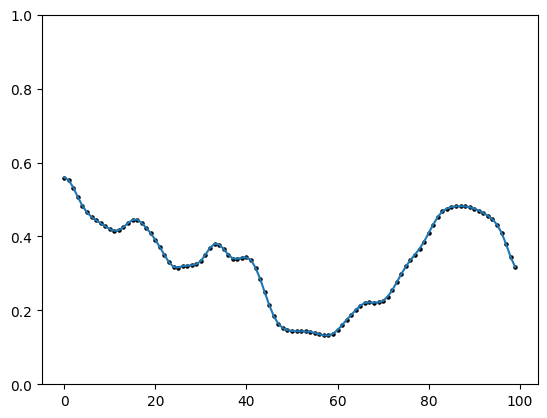

In [13]:
def noise_1D_wave(steps, time, increment):
    vals = []

    for i in range(steps):
        vals.append(perlin_noise(time))
        time += increment

    vals = np.array(vals)
    return vals


steps = 100
increment = 0.03
time = 4

simple_noise_wave = noise_1D_wave(steps, time, increment)

plt.plot(simple_noise_wave)
plt.scatter(np.arange(100), simple_noise_wave, s=5, c='black')
plt.ylim(0,1)
plt.show()

### Perlin Noise and sine wave
Perlin noise function multiplied by sine at appropriate period will reach the target when interpolating latent space .

Properly phase shifted sine or cosine wave guarantees that start and begin will be equal to 0.

Square wave smooth approximation uses equation:

$f(x) = \frac{sin(x)}{\sqrt{sin(x)^2 + \alpha^2}}$

where $\alpha$ is constant value of "roundness".

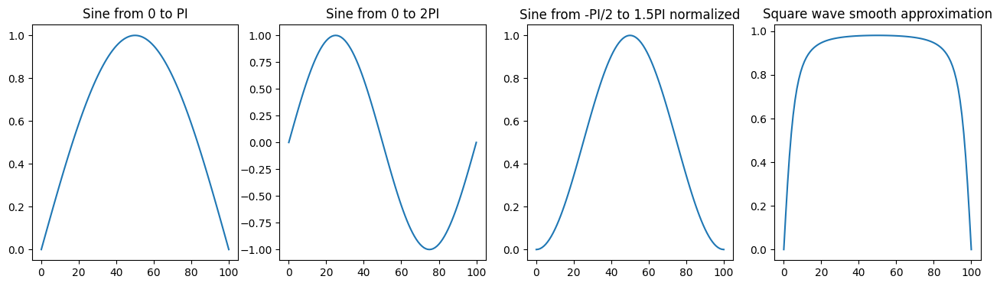

In [14]:
sine_steps = 100

def generate_sine_wave(steps, start, period):
    points = []

    increment = period / steps

    for i in range(steps + 1):
        val = math.sin((increment * i) + start)
        points.append(val)


    points = np.array(points)
    return points


def smooth_square_wave(steps, alpha):

    points = []
    increment = math.pi / steps

    for i in range(steps + 1):
        s = math.sin(increment * i)
        val = s / math.sqrt(s ** 2 + alpha ** 2)

        points.append(val)

    points = np.array(points)
    return points


wave_1 = generate_sine_wave(sine_steps, 0, math.pi)
wave_2 = generate_sine_wave(sine_steps, 0, math.pi * 2)
wave_3 = generate_sine_wave(sine_steps, -math.pi/2, math.pi * 2)
wave_3 = (wave_3 + 1) / 2
wave_4 = smooth_square_wave(sine_steps, 0.2)

fig, axs = plt.subplots(1, 4, figsize=(16, 4))

axs[0].plot(wave_1)
axs[0].set_title('Sine from 0 to PI')

axs[1].plot(wave_2)
axs[1].set_title('Sine from 0 to 2PI')

axs[2].plot(wave_3)
axs[2].set_title('Sine from -PI/2 to 1.5PI normalized')

axs[3].plot(wave_4)
axs[3].set_title('Square wave smooth approximation')

plt.show()

### Applying sine to Perlin Noise

* First wave has lesser accuracy on the edges but it prevents from high slopes unlike square wave.

* Second wave doesn't smooth edges that much but inverses the noise from its middle. It tends to have high slopes at the middle.

* Third wave is too smooth.

* Fourth wave has the best approximation but it has high slopes at the beginning and end. Alpha parameter near 1 creates similar result to first wave but function never reaches value 1.

* Range -1,1 visually looks better and less dependent on sine wave.

* There is no 100% winner.

*We can loop until we find values close to zero at the beginning and end of cycle but it's not computationally efficient and makes sense on one dimension.*

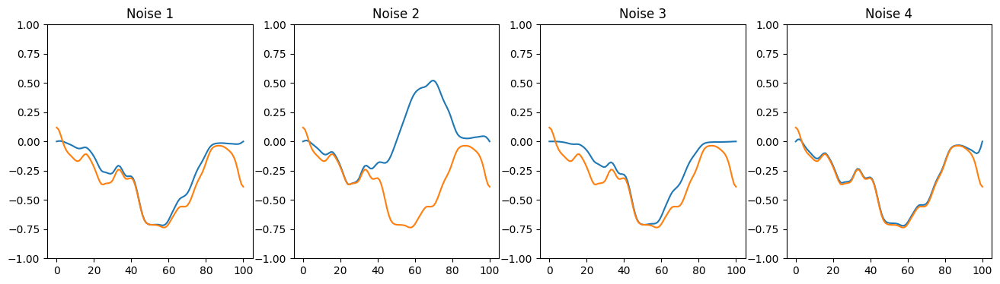

In [15]:
steps = 100

increment = 0.03

noise_0 = noise_1D_wave(steps + 1, time, increment)
noise_0 = (noise_0 * 2) - 1

noise_1 = noise_0 * wave_1
noise_2 = noise_0 * wave_2
noise_3 = noise_0 * wave_3
noise_4 = noise_0 * wave_4

fig, axs = plt.subplots(1, 4, figsize=(16, 4))

axs[0].plot(noise_1)
axs[0].plot(noise_0)
axs[0].set_ylim(-1,1)
axs[0].set_title('Noise 1')

axs[1].plot(noise_2)
axs[1].plot(noise_0)
axs[1].set_ylim(-1,1)
axs[1].set_title('Noise 2')

axs[2].plot(noise_3)
axs[2].plot(noise_0)
axs[2].set_ylim(-1,1)
axs[2].set_title('Noise 3')

axs[3].plot(noise_4)
axs[3].plot(noise_0)
axs[3].set_ylim(-1,1)
axs[3].set_title('Noise 4')

plt.show()

### A better solution: Circular Noise function
Circular movement around 2D noise space will result in a loop cycle. If we substract the beginning value from others this method guarantees we start and end at point zero (it's important when interpolating to eventually reach the target).

Drawback of this method is different way of handling increment parameters which must be mapped to range 0, 2Pi to create a cycle. It introduces a new parameter of radius.

*Sometimes due to approximation errors small differences occur, we can just set the value to zero manually.*

*dx and dy values can't be 0 because it will produce a symmetrical wave.*

Beginning and ending point: 0.0 == 0.0 = True
Difference: 0.0


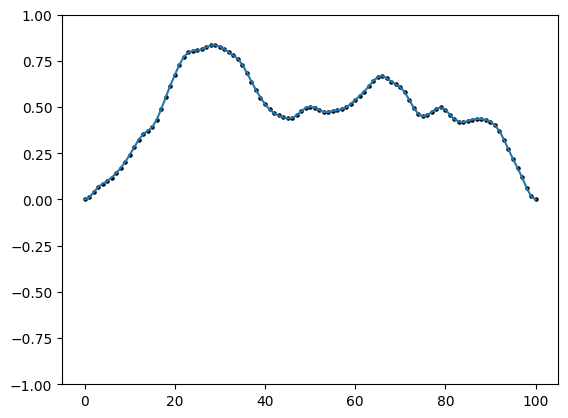

In [16]:
def circular_perlin_noise(time, radius, dx, dy):

    x = dx + radius * math.cos(math.pi * 2 * time)
    y = dy + radius * math.sin(math.pi * 2 * time)

    n = perlin_noise(x,y)

    return n



def generate_circular_wave(steps, radius, pos_shift, time):

    looped_noise = []

    increment = 1 / steps

    for i in range(steps + 1):
        noise = circular_perlin_noise(time, radius, pos_shift, pos_shift)
        noise = (noise * 2) - 1

        looped_noise.append(noise)

        time += increment

    looped_noise = np.array(looped_noise) - looped_noise[0]

    return looped_noise


steps = 100
radius = 0.5
increment = 0.01
pos_shift = random.randint(0,10000)

looped_noise = generate_circular_wave(steps, radius, pos_shift, time)


print(f"Beginning and ending point: {looped_noise[0]} == {looped_noise[-1]} = {looped_noise[0] == looped_noise[-1]}")
print(f"Difference: {looped_noise[0] - looped_noise[-1]}")
plt.plot(looped_noise)
plt.ylim(-1,1)
plt.scatter(np.arange(steps+1), looped_noise, s=5, c='black')
plt.show()

# 5. Perlin Noise fields.
Below are noise generator functions. You can change the increments in x and y axis or time. In project's *proof of concept* folder you can play around with Processing sketches to check how these functions behave with different parameters.

### Noise generators

In [17]:
def noise_2D_horizontal(val, y, x, dx, dy, time):
    return perlin_noise(x * dx + time, y * dy) 


def noise_2D_vertical(val, y, x, dx, dy, time):
    return perlin_noise(x * dx, y * dy + time) 


def noise_2D(val, y, x, dx, dy, time):
    return perlin_noise(x * dx + time, y * dy + time) 


def noise_2D_cos(val, y, x, dx, dy, time, alpha=0.4):
    val = perlin_noise(x * dx, y * dy, time)
    val *= math.cos(val * 255 * alpha)
    return val


def noise_2D_cos_sin(val, y, x, dx, dy, time, alpha=0.4, beta=0.5):
    val = perlin_noise(x * dx, y * dy, time)
    val *= math.cos(val * 255 * alpha) * math.sin(val * 255 * beta)
    return val  


def noise_3D_inplace(val, y, x, dx, dy, time):
    return perlin_noise(x * dx, y * dy, time)


def noise_3D(val, y, x, dx, dy, time):
    return perlin_noise(x * dx + time, y * dy + time, time)


def noise_2D_vertical(val, y, x, dx, dy, time):
    return perlin_noise(time, y * dy + time)


def noise_2D_horizontal(val, y, x, dx, dy, time):
    return perlin_noise(time, x * dx + time)

### Generate 2D noise field

In [18]:
def generate_noise_field(generator, width, height, step_x, step_y, time):

    noise_field = np.ndarray((height, width))

    indices_width = np.arange(noise_field.shape[0])[:, np.newaxis]
    indices_height = np.arange(noise_field.shape[1])

    vectorized_generator = np.vectorize(generator)

    noise_field = vectorized_generator(noise_field, indices_width, indices_height, step_x, step_y, time)

    return noise_field


def noise_field_visualize(noise_field):
    plt.axis("off")
    plt.imshow(noise_field, cmap='gray')
    print(f"Noise field dimensions: {noise_field.shape}")

    noise_max = tf.math.reduce_max(noise_field)
    noise_min = tf.math.reduce_min(noise_field)
    noise_mean = tf.math.reduce_mean(noise_field)
    noise_diff = abs(noise_max-noise_min)

    print(f"\nMax: \t{noise_max}\nMin: \t{noise_min}\nDiff: \t{noise_diff}\n\nMean: \t{noise_mean}\n")

### Preview a single frame of noise field

Noise field dimensions: (77, 768)

Max: 	0.5544324541845911
Min: 	-0.43124246238674163
Diff: 	0.9856749165713328

Mean: 	-0.01752336324788706



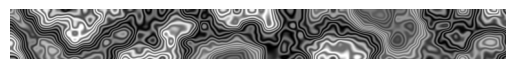

In [19]:
NOISE_FUNCTION = noise_2D_cos_sin

STEP_X = 0.01
STEP_Y = 0.01
TIME = 0.0

SCALE = 1.0

noise_field = generate_noise_field(NOISE_FUNCTION, 768, 77, STEP_X, STEP_Y, TIME)
noise_field *= SCALE
noise_field_visualize(noise_field)

### Create animation of noise field flow

In [20]:
def create_noise_flow(frame_amount, time_step, noise_function, width, height, step_x, step_y, time):

    frames = []

    for frame in range(frame_amount):
        noise_field = generate_noise_field(noise_function, width, height, step_x, step_y, time)

        frames.append(noise_field)
        time += time_step

    
    return frames

### Helper function for saving as a GIF file

In [22]:
def save_as_gif(name, frames, duration, show=True):
 
    animation = []

    for frame in frames:
        converted_frame = frame * 255
        converted_frame = np.maximum(converted_frame, 0)
        converted_frame = converted_frame.astype('uint8')
        img = Image.fromarray(converted_frame)
        animation.append(img)

    file_name = f'{name}.gif'

    animation[0].save(file_name, format='GIF', append_images=animation[1:], save_all=True, duration=duration, loop=0)

    if show:
        with open(file_name,'rb') as f:
            display(Img(data=f.read(), format='gif'))

### Preview the sample flow

30 0.01 <function noise_2D_cos_sin at 0x7f3f404cd870> 0.01 0.01 0


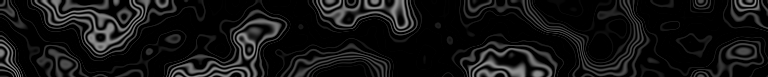

In [23]:
FRAME_AMOUNT = 30
TIME_STEP = 0.01
TIME = 0

print(FRAME_AMOUNT, TIME_STEP, NOISE_FUNCTION, STEP_X, STEP_Y, TIME)

sample_flow = create_noise_flow(FRAME_AMOUNT, TIME_STEP, NOISE_FUNCTION, 768, 77, STEP_X, STEP_Y, TIME)

save_as_gif('noise_preview', sample_flow,FRAME_AMOUNT)

# 6. Preview merged encoding with noise.

*It's important to notice that the generated GIFs aren't the true representations, their values were processed for visibility (scaling and cutting values below zero for contrast). For image generation you shouldn't use them.*

In [24]:
sample_thresholds = get_columns_threshold(long_encoding_vis)
sample_thresholds_mask = create_threshold_mask(long_encoding_vis, sample_thresholds)

sample_thresholds_mask_inversed = tf.where(sample_thresholds_mask == 1, 0, 1)
sample_thresholds_mask_inversed = tf.cast(sample_thresholds_mask_inversed, 'float16')

sample_significance_mask = mask_significant_neurons(long_prompt_encoding, -2, 2)

### Helper function for filling tails

In [25]:
def create_repeated_noise_tails(noise, thresholds):

    noise_with_tails = copy.deepcopy(noise)

    for noise_frame in noise_with_tails:
        for noise_col in range(len(noise_frame)):
            threshold = thresholds[noise_col]
            last_noise_val = noise_frame[threshold, noise_col]

            noise_frame[threshold:, noise_col] = last_noise_val

    return noise_with_tails

### Test 1: Merge
The noise is flowing through latent space without limitations.

Merge encoding with noise



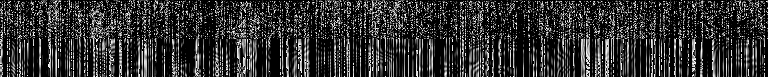

In [26]:
def experiment_1(encoding, noise):
    print("Merge encoding with noise\n")
    return encoding + noise


test_1 = experiment_1(long_prompt_encoding, sample_flow)

save_as_gif('test_1', test_1, FRAME_AMOUNT)

### Test 2: Flow only through significantly encoded time steps

Flow only through significantly encoded time steps



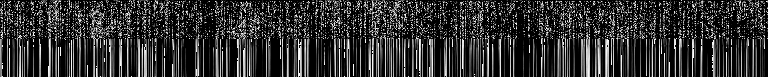

In [27]:
def experiment_2(encoding, noise, threshold_mask):
    print("Flow only through significantly encoded time steps\n")
    return (noise * threshold_mask) + encoding


test_2 = experiment_2(long_prompt_encoding, sample_flow, sample_thresholds_mask)

save_as_gif('test_2', test_2, FRAME_AMOUNT)

### Test 3: Apply repeated noise value through time steps "tails"

Apply repeated noise value through time steps "tails"



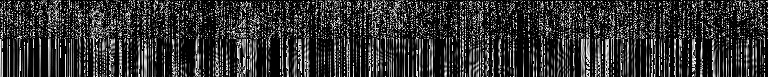

In [28]:
def experiment_3(encoding, noise, thresholds):
    print('Apply repeated noise value through time steps "tails"\n')

    noise_with_tails = create_repeated_noise_tails(noise, thresholds)

    return noise_with_tails + encoding


test_3 = experiment_3(long_prompt_encoding, sample_flow, sample_thresholds)

save_as_gif('test_3', test_3, FRAME_AMOUNT)

### Test 4: Flow only through tails

Flow only through tails



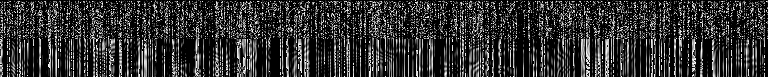

In [29]:
def experiment_4(encoding, noise, thresholds_mask):
    print("Flow only through tails\n")
    return (noise * thresholds_mask) + encoding


test_4 = experiment_4(long_prompt_encoding, sample_flow, sample_thresholds_mask_inversed)

save_as_gif('test_4', test_4, FRAME_AMOUNT)

### Test 5: Flow only through tails where noise is repeated

Flow only through tails where noise is repeated



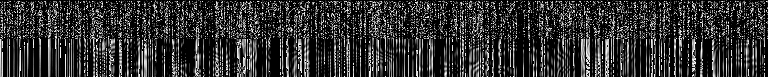

In [30]:
def experiment_5(encoding, noise, thresholds, thresholds_mask):
    print("Flow only through tails where noise is repeated\n")

    noise_with_tails = create_repeated_noise_tails(noise, thresholds)

    return (noise_with_tails * thresholds_mask) + encoding


test_5 = experiment_5(long_prompt_encoding, sample_flow, sample_thresholds, sample_thresholds_mask_inversed)

save_as_gif('test_5', test_5, FRAME_AMOUNT)

### Test 6: Flow through significant neurons

Flow through significant neurons

Significance threshold over: +/- 2


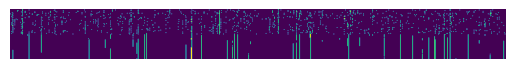

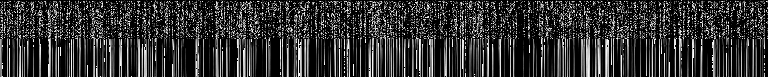

In [31]:
def experiment_6(encoding, noise, significance_mask):
    print("Flow through significant neurons\n")
    return (noise * significance_mask) + encoding


test_6 = experiment_6(long_prompt_encoding, sample_flow, sample_significance_mask)

print(f"Significance threshold over: +/- {2}")
plt.axis("off")
plt.imshow(sample_significance_mask)
plt.show()

save_as_gif('test_6', test_6, FRAME_AMOUNT)

### Test 7: Flow through significant neurons only in significantly encoded time steps.

Flow through significant neurons only in significantly encoded time steps.



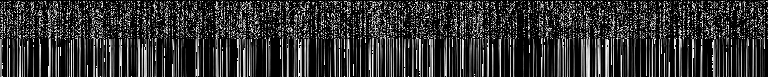

In [32]:
def experiment_7(encoding, noise, significance_mask, thresholds_mask):
    print("Flow through significant neurons only in significantly encoded time steps.\n")
    return (noise * significance_mask * thresholds_mask) + encoding


test_7 = experiment_7(long_prompt_encoding, sample_flow, sample_significance_mask, sample_thresholds_mask)

save_as_gif('test_7', test_7, FRAME_AMOUNT)

### Test 8: Flow through significant neurons but repeat noise through time steps tails

Flow through significant neurons but repeat noise through time steps tails



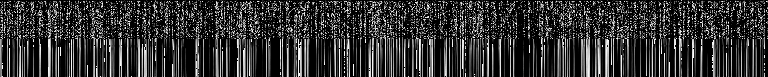

In [33]:
def experiment_8(encoding, noise, significance_mask, thresholds):
    print("Flow through significant neurons but repeat noise through time steps tails\n")

    noise_with_tails = create_repeated_noise_tails(noise, thresholds)

    return (noise_with_tails * significance_mask) + encoding


test_8 = experiment_8(long_prompt_encoding, sample_flow, sample_significance_mask, sample_thresholds)

save_as_gif('test_8', test_8, FRAME_AMOUNT)

### Test 9: Flow only through significant neurons but through later time steps.



Flow only through significant neurons but through later time steps



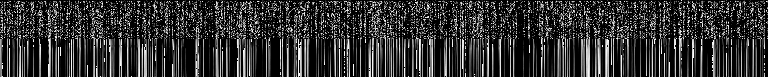

In [34]:
def experiment_9(encoding, noise, significance_mask, thresholds_mask):
    print("Flow only through significant neurons but through later time steps\n")

    return (noise * significance_mask * thresholds_mask) + encoding


test_9 = experiment_9(long_prompt_encoding, sample_flow, sample_significance_mask, sample_thresholds_mask_inversed)

save_as_gif('test_9', test_9, FRAME_AMOUNT)

### Test 10: Flow only through significant neurons but through later time steps with repeated noise.

Flow only through significant neurons but through later time steps with repeated noise



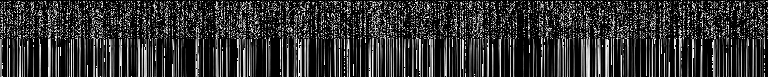

In [35]:
def experiment_10(encoding, noise, significance_mask, thresholds_mask):
    print("Flow only through significant neurons but through later time steps with repeated noise\n")

    noise_with_tails = create_repeated_noise_tails(noise, thresholds)

    return (noise_with_tails * significance_mask * thresholds_mask) + encoding


test_10 = experiment_10(long_prompt_encoding, sample_flow, sample_significance_mask, sample_thresholds_mask_inversed)

save_as_gif('test_10', test_10, FRAME_AMOUNT)

### Test 11: One dimensional (uniform) flow

Uniform noise across encoding



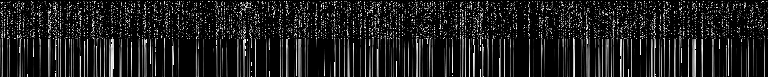

In [36]:
def experiment_11(encoding, steps, time_step):
    print("Uniform noise across encoding\n")

    frames = []
    time = 0

    for i in range(steps):
        noise = perlin_noise(time)
        noise = (noise * 2) - 1

        frames.append(encoding + noise)

        time += time_step

    return frames

test_11 = experiment_11(long_prompt_encoding, FRAME_AMOUNT, 0.01)

save_as_gif('test_11', test_11, FRAME_AMOUNT)

# 7. Gaussian random noise + Perlin noise
An example how diffusion noise can be mixed with Perlin noise.

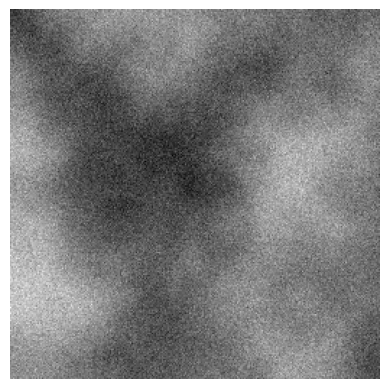

In [37]:
noise_function = noise_2D

STEP_X = 0.01
STEP_Y = 0.01
TIME = 0.0

SCALE = 3.0

noise_field = generate_noise_field(noise_function, 256,256, STEP_X, STEP_Y, TIME)
noise_field *= SCALE
noise_field = (noise_field * 2) - 1

gaussian_noise = tf.random.normal((256,256)) / SCALE

gaussian_noise += noise_field

plt.axis('off')
plt.imshow(gaussian_noise, cmap='gray')
plt.show()

# 8. Prompt interpolation

In [ ]:
RANDOM_SEED = 12345
counter = 0

prompt_1 = "A photograph of a dog"
prompt_2 = "A photograph of a cat"

encoding_1 = tf.squeeze(model.encode_text(prompt_1))
encoding_2 = tf.squeeze(model.encode_text(prompt_2))

same_values_mask = np.equal(encoding_1, encoding_2)
print(f"Same values: {np.count_nonzero(same_values_mask)} which is {(np.count_nonzero(same_values_mask) / (77*768)) * 100:.2f}%")

# TODO -> use the masks
# sample_thresholds = get_columns_threshold(long_encoding_vis)
# sample_thresholds_mask = create_threshold_mask(long_encoding_vis, sample_thresholds)

# sample_thresholds_mask_inversed = tf.where(sample_thresholds_mask == 1, 0, 1)
# sample_thresholds_mask_inversed = tf.cast(sample_thresholds_mask_inversed, 'float16')

# sample_significance_mask = mask_significant_neurons(long_prompt_encoding, -2, 2)
# np.random.seed(RANDOM_SEED)


Same values: 3864 which is 6.53%


### Uniform interpolation

Tests on same photos:

| Description | Results | Steps | Radius | Time | Pos shift | Scale |
|-------------|---------|-------|--------|------|-----------|-------|
|Empty        |         |       |        |      |           |       |

In [ ]:
"""
1. create the noise wave for steps
2. create interpolations for steps
3. Sum noise with interpolations
4. Interpolate
"""

STEPS = 30
RADIUS = 0.8
TIME = 0
POS_SHIFT = 200

SCALE = 2

# tf.random.set_seed(RANDOM_SEED)
seed_noise = tf.random.normal((IMG_WIDTH // 8, IMG_HEIGHT // 8, 4), seed = RANDOM_SEED)

looped_noise = generate_circular_wave(STEPS, RADIUS,  POS_SHIFT, TIME) 
looped_noise *= SCALE

plt.plot(looped_noise)
plt.ylim(-1,1)
plt.scatter(np.arange(STEPS+1), looped_noise, s=5, c='black')
plt.show()

def interpolate(encoding_1, encoding_2, steps):
    interpolated_encodings = tf.linspace(encoding_1, encoding_2, steps + 1)
    interpolated_encodings = interpolated_encodings.numpy()

    for i in range(len(interpolated_encodings)):
        interpolated_encodings[i] += looped_noise[i] #* same_values_mask

    return interpolated_encodings


interpolated_encodings = interpolate(encoding_1, encoding_2, STEPS)

images = []

for step in range(STEPS+1):
    print(f"Step: {step+1} / {STEPS+1}")
    img = model.generate_image(
        interpolated_encodings[step], 
        diffusion_noise=seed_noise,
        num_steps=25,
    )
    images.append(Image.fromarray(np.squeeze(img)))

images[0].save(f'interpolation_{counter}.gif', format='GIF', append_images=images[1:], save_all=True, duration=200, loop=0)

with open(f'interpolation_{counter}.gif','rb') as f:
    display(Img(data=f.read(), format='gif'))

counter += 1

# plt.imshow(images[0])
# plt.show()
# plt.imshow(images[-1])
# plt.show()

### 2D field interpolation

In [ ]:
# TODO

'\n1. create the 2D noise\n2. create interpolations for steps\n3. Sum noise with interpolations\n4. Interpolate\n'

# 9. Perlin noise flow over prompt encoder manifold

In [ ]:
# TODO

# 10. Perlin noise flow over the diffusion noise space.

In [ ]:
# TODO